# Capstone 3 - Blood Cell Classification - Preprocessing and Modeling - CNN

Previously we loaded the original images into the notebook and transformed them for better edge detection in the modeling portion of the data. We also found that the dataset had a limited amount of images. We will be dealing with this problem in this portion of the project with more data augmentation via brightness adjustements, cropping, etc. of all images. The most important step will be the modeling, where we will create our own convolutional neural network to train and test on the data and also use a pre-trained model. We will lastly compare the performance of the models.

## Loading Data and Images

In [4]:
import pandas as pd
import os
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D, Flatten, ELU, Dense
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import precision_score, recall_score, f1_score, classification_report
import cv2
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
import pickle
import math
import random
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.applications import VGG16

2025-03-07 11:37:43.293162: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [5]:
df = pd.read_csv("annotations3.csv")

In [6]:
df.head()

,image,label
0,transformed_images/image-1.png,wbc
1,transformed_images/image-2.png,wbc
2,transformed_images/image-4.png,wbc
3,transformed_images/image-7.png,wbc
4,transformed_images/image-8.png,wbc


In [7]:
def plot_images(images):
    # Calculate grid size based on number of images
    num_images = len(images)
    grid_size = (math.ceil(num_images / 3), 3)  # 3 columns, adjust rows dynamically

    # Create a grid of subplots
    fig, axes = plt.subplots(grid_size[0], grid_size[1], figsize=(10, grid_size[0] * 3))

    # Flatten axes array for easy iteration (in case it's 2D)
    axes = axes.flatten()

    for ax, img in zip(axes, images):
        ax.imshow(img)
        ax.axis('off')  # Hide axis
    
    # Remove any unused axes (if the grid size is larger than the number of images)
    for i in range(len(images), len(axes)):
        axes[i].axis('off')
    
    plt.tight_layout()  # Adjust layout to ensure images fit nicely
    plt.show()

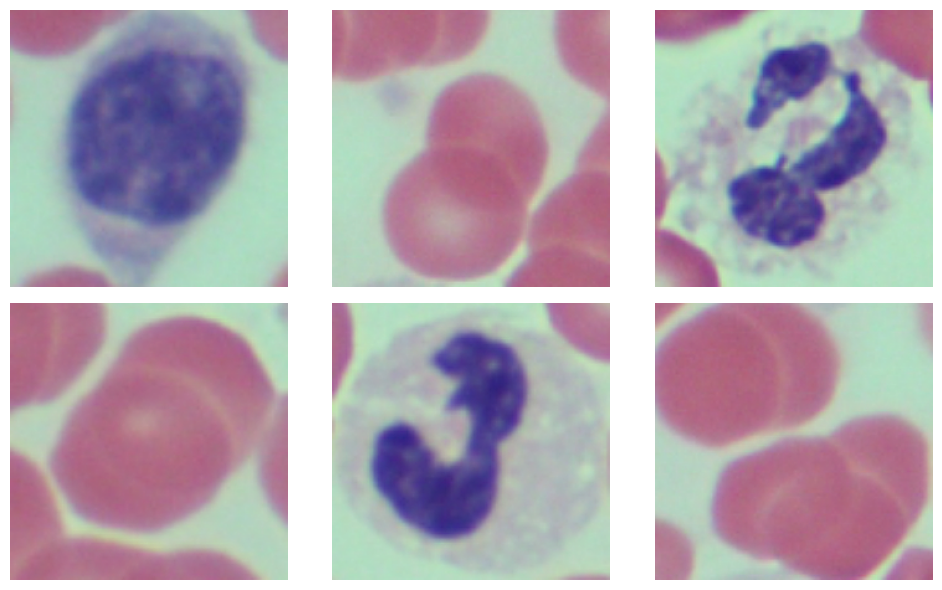

In [8]:
get_images = [np.array(Image.open(img_path)) for img_path in df.image[67:73]]
plot_images(get_images)

## Preprocessing

As conveyed below we have a small amount og images. To fix this situation we will perfrom data augmentation techniques to improve the amount of images and robustness of the model.

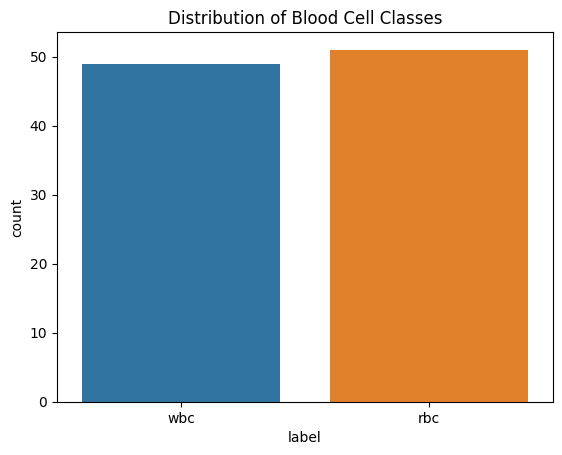

In [11]:
sns.countplot(x='label', data=df) 
plt.title('Distribution of Blood Cell Classes')
plt.show()

In [12]:
df.shape

(100, 2)

In [13]:
df['label'].value_counts()

label
rbc    51
wbc    49
Name: count, dtype: int64

In [14]:
image_path = df.loc[0, 'image']  # Get the file path from the first row
image = Image.open(image_path)

# Get the image shape (width, height)
image_shape = image.size  # Returns (width, height)
print(image_shape)

(224, 224)


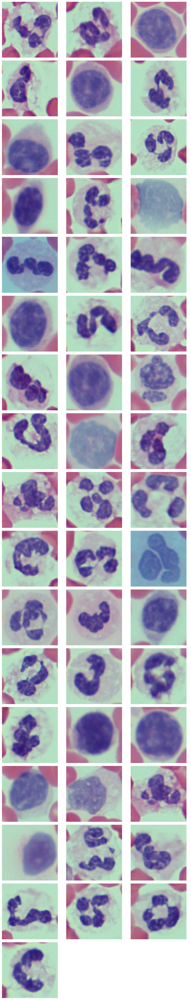

In [15]:
# Filter the DataFrame to find the row(s) with the desired image path
trans_images = df[df['label'].str.contains('wbc', case=False)] 

# Load images into a list of NumPy arrays
get_images = [np.array(Image.open(img_path)) for img_path in trans_images['image']]

# Plot the images in a grid
if get_images:
    plot_images(get_images)
else:
    print("No images found")

In [16]:
df['image_path'] = df['image']

### Flip and append flipped images

In [18]:
def flipped_images(df, output_folder="preprocessed_images"):
    new_df = df.copy() 
    wbc_images = df[df['label'].isin(['wbc', 'rbc'])].copy()
    new_rows = []

    for _, row in wbc_images.iterrows():
        image_path = row['image']  # Ensure correct column name
        image = Image.open(image_path)
        image = np.array(image)  # Convert to NumPy

        # Convert to Tensor and apply transformations manually
        image_tensor = tf.convert_to_tensor(image, dtype=tf.float32)
        image_tensor = tf.expand_dims(image_tensor, axis=0)  

        # Apply transformations manually
        flipped_image = tf.image.flip_left_right(image_tensor)  

        # Convert back to NumPy
        augmented_image = tf.squeeze(flipped_image).numpy().astype(np.uint8)

        image_name = os.path.basename(image_path)  
        flipped_image_path = os.path.join(output_folder, image_name.replace(".png", "_flipped.png"))
        Image.fromarray(augmented_image).save(flipped_image_path)

        # Append new row with flipped image path (keeping all columns)
        new_row = row.copy()
        new_row['image_path'] = flipped_image_path  # Update image path
        new_rows.append(new_row)

    new_df = pd.concat([new_df, pd.DataFrame(new_rows)], ignore_index=True)                              
    return new_df

In [19]:
df = flipped_images(df)

In [20]:
df['label'].value_counts()

label
rbc    102
wbc     98
Name: count, dtype: int64

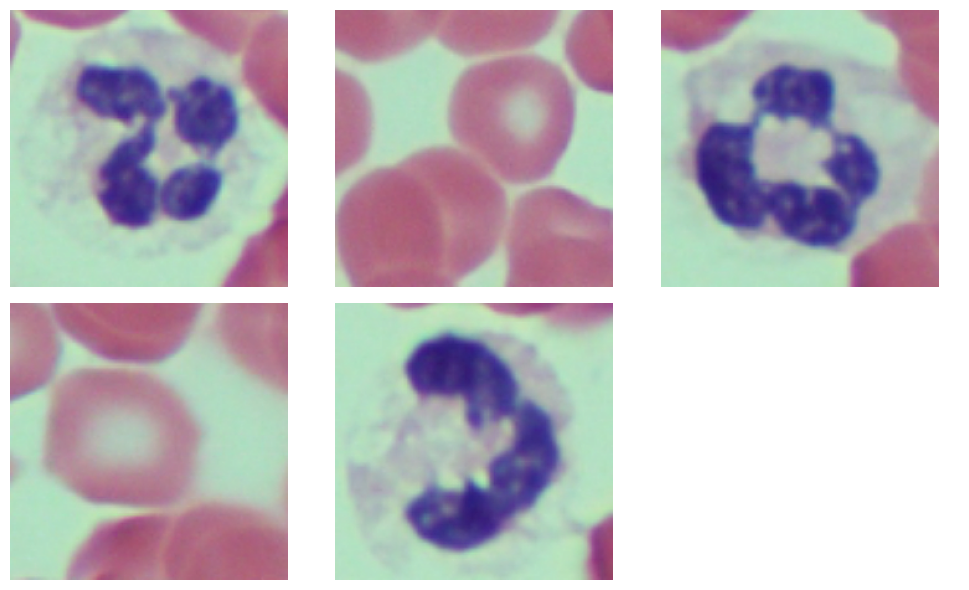

In [21]:
get_images = [np.array(Image.open(img_path)) for img_path in df.image_path[195:]]
plot_images(get_images)

In [22]:
df.tail()

,image,label,image_path
195,transformed_images/image-116.png,wbc,preprocessed_images/image-116_flipped.png
196,transformed_images/image-117.png,rbc,preprocessed_images/image-117_flipped.png
197,transformed_images/image-118.png,wbc,preprocessed_images/image-118_flipped.png
198,transformed_images/image-119.png,rbc,preprocessed_images/image-119_flipped.png
199,transformed_images/image-120.png,wbc,preprocessed_images/image-120_flipped.png


### Applying random brightness and appending images

In [24]:
def random_brightness_images(df, output_folder="preprocessed_images"):
    new_df = df.copy() 
    wbc_images = df[df['label'].isin(['wbc', 'rbc'])].copy()
    new_rows = []

    for _, row in wbc_images.iterrows():
        image_path = row['image_path']  # Ensure correct column name
        image = Image.open(image_path)
        image = np.array(image)  # Convert to NumPy

        # Convert to Tensor and apply transformations manually
        image_tensor = tf.convert_to_tensor(image, dtype=tf.float32)
        image_tensor = tf.expand_dims(image_tensor, axis=0)  # Add batch dimension

        # Apply transformations manually
        seed = (np.random.randint(0, 1000), np.random.randint(0, 1000))
        stateless_random_brightness = tf.image.stateless_random_brightness(
        image_tensor, max_delta=0.9, seed=seed)

        # Convert back to NumPy
        augmented_image = tf.squeeze(stateless_random_brightness).numpy().astype(np.uint8)

        image_name = os.path.basename(image_path)  # Get just the filename
        brightness_image_path = os.path.join(output_folder, image_name.replace(".png", "_bright.png"))
        Image.fromarray(augmented_image).save(brightness_image_path)

        new_row = row.copy()
        new_row['image_path'] = brightness_image_path  # Update image path
        new_rows.append(new_row)

    new_df = pd.concat([new_df, pd.DataFrame(new_rows)], ignore_index=True)                              
    return new_df

In [25]:
df = random_brightness_images(df)

In [26]:
df['label'].value_counts()

label
rbc    204
wbc    196
Name: count, dtype: int64

In [27]:
df.tail()

,image,label,image_path
395,transformed_images/image-116.png,wbc,preprocessed_images/image-116_flipped_bright.png
396,transformed_images/image-117.png,rbc,preprocessed_images/image-117_flipped_bright.png
397,transformed_images/image-118.png,wbc,preprocessed_images/image-118_flipped_bright.png
398,transformed_images/image-119.png,rbc,preprocessed_images/image-119_flipped_bright.png
399,transformed_images/image-120.png,wbc,preprocessed_images/image-120_flipped_bright.png


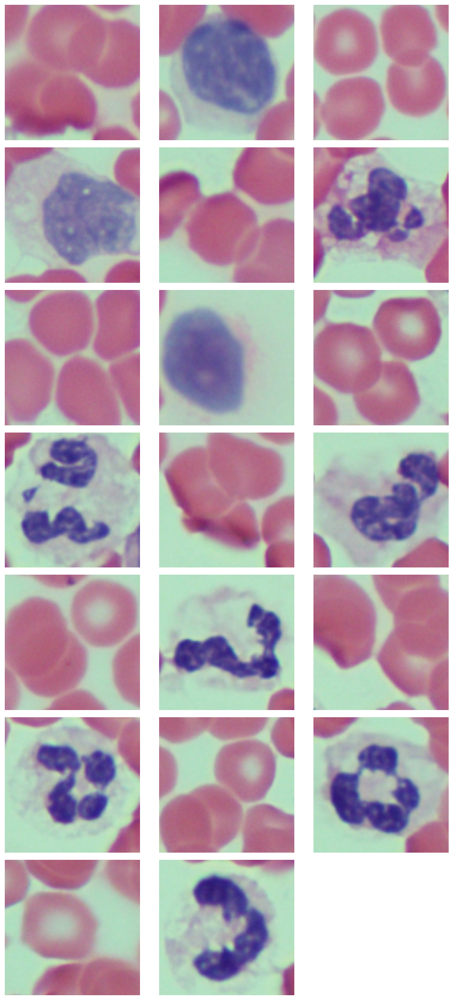

In [28]:
get_images = [np.array(Image.open(img_path)) for img_path in df.image_path[380:]]
plot_images(get_images)

### Rotation and appending images

In [30]:
def rotated_images(df, output_folder="preprocessed_images"):
    new_df = df.copy() 
    wbc_images = df[df['label'].isin(['wbc', 'rbc'])].copy()
    new_rows = []

    for _, row in wbc_images.iterrows():
        image_path = row['image_path']  # Ensure correct column name
        image = Image.open(image_path)

        # Rotate the image using PIL
        rotated_image = image.transpose(Image.ROTATE_90)
        
        image_name = os.path.basename(image_path)  # Get just the filename
        rotated_image_path = os.path.join(output_folder, image_name.replace(".png", "_rotated.png"))
        rotated_image.save(rotated_image_path)

        new_row = row.copy()
        new_row['image_path'] = rotated_image_path  # Update image path
        new_rows.append(new_row)

    new_df = pd.concat([new_df, pd.DataFrame(new_rows)], ignore_index=True)                              
    return new_df

In [31]:
df = rotated_images(df)

In [32]:
df['label'].value_counts()

label
rbc    408
wbc    392
Name: count, dtype: int64

In [33]:
df.tail()

,image,label,image_path
795,transformed_images/image-116.png,wbc,preprocessed_images/image-116_flipped_bright_r...
796,transformed_images/image-117.png,rbc,preprocessed_images/image-117_flipped_bright_r...
797,transformed_images/image-118.png,wbc,preprocessed_images/image-118_flipped_bright_r...
798,transformed_images/image-119.png,rbc,preprocessed_images/image-119_flipped_bright_r...
799,transformed_images/image-120.png,wbc,preprocessed_images/image-120_flipped_bright_r...


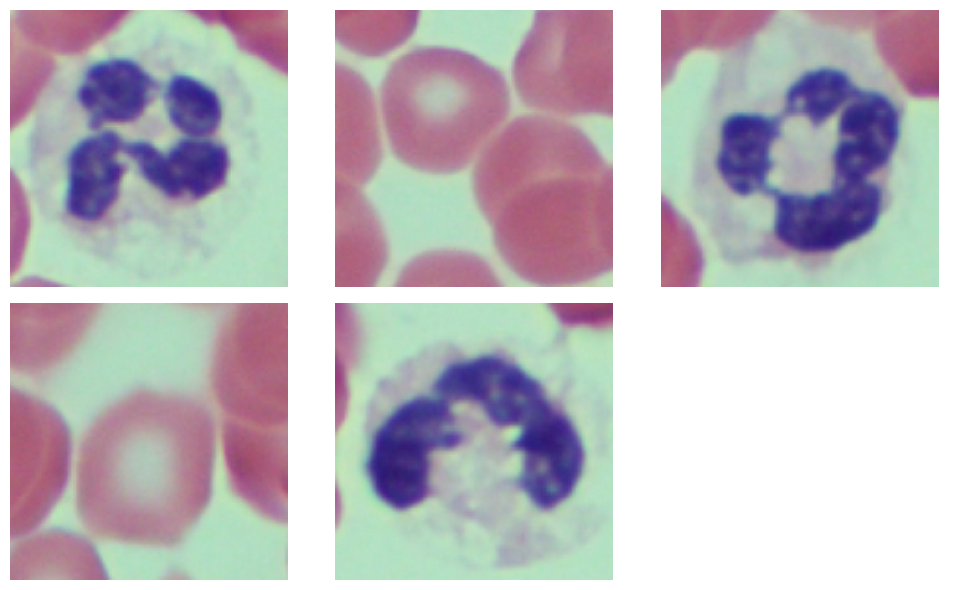

In [34]:
get_images = [np.array(Image.open(img_path)) for img_path in df.image_path[795:]]
plot_images(get_images)

### Crop and append images

In [36]:
def cropped_images(df, output_folder="preprocessed_images"):
    os.makedirs(output_folder, exist_ok=True)

    new_df = df.copy()
    wbc_images = df[df['label'].isin(['wbc', 'rbc'])].copy()
    new_rows = []

    for _, row in wbc_images.iterrows():
        image_path = row['image_path']
        image = Image.open(image_path)

        # Convert image to NumPy array
        image_array = np.array(image)
        height, width = image_array.shape[:2]  # Keep original dimensions

        # Define crop size (50% center crop)
        crop_fraction = 0.5
        crop_h = int(height * crop_fraction)
        crop_w = int(width * crop_fraction)
        start_h = (height - crop_h) // 2
        start_w = (width - crop_w) // 2

        # Crop the image manually using slicing
        cropped_array = image_array[start_h:start_h + crop_h, start_w:start_w + crop_w]

        # Convert back to PIL Image
        cropped_pil_image = Image.fromarray(cropped_array)

        # Save the cropped image
        image_name = os.path.basename(image_path)
        cropped_image_path = os.path.join(output_folder, image_name.replace(".png", "_crop.png"))
        cropped_pil_image.save(cropped_image_path)

        # Append new row with updated image path
        new_row = row.copy()
        new_row['image_path'] = cropped_image_path  # Update image path
        new_rows.append(new_row)

    # Add new images to dataframe
    new_df = pd.concat([new_df, pd.DataFrame(new_rows)], ignore_index=True)
    return new_df

In [37]:
df = cropped_images(df)

In [38]:
df['label'].value_counts()

label
rbc    816
wbc    784
Name: count, dtype: int64

In [39]:
df.tail()

,image,label,image_path
1595,transformed_images/image-116.png,wbc,preprocessed_images/image-116_flipped_bright_r...
1596,transformed_images/image-117.png,rbc,preprocessed_images/image-117_flipped_bright_r...
1597,transformed_images/image-118.png,wbc,preprocessed_images/image-118_flipped_bright_r...
1598,transformed_images/image-119.png,rbc,preprocessed_images/image-119_flipped_bright_r...
1599,transformed_images/image-120.png,wbc,preprocessed_images/image-120_flipped_bright_r...


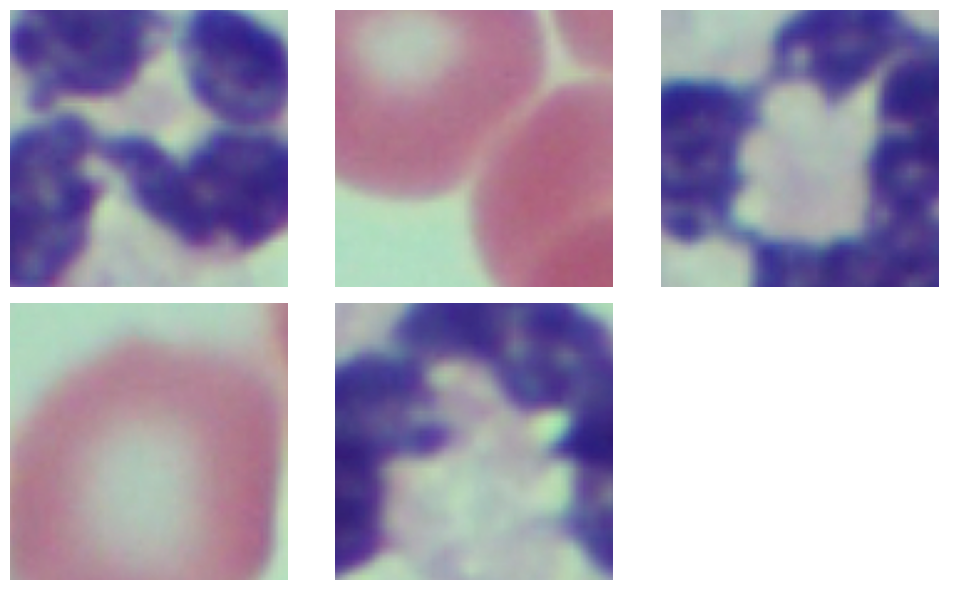

In [40]:
get_images = [np.array(Image.open(img_path)) for img_path in df.image_path[1595:]]
plot_images(get_images)

Now that we have flipped, cropped, rotated, and adjusted brightness for the white blood cell class to create a more robust dataset and allow for the model to be more robust by learning a diverse set of images. Now we will build the model. We will build a custom one and then compare the performance to a pre-trained model.

In [43]:
df.head()

,image,label,image_path
0,transformed_images/image-1.png,wbc,transformed_images/image-1.png
1,transformed_images/image-2.png,wbc,transformed_images/image-2.png
2,transformed_images/image-4.png,wbc,transformed_images/image-4.png
3,transformed_images/image-7.png,wbc,transformed_images/image-7.png
4,transformed_images/image-8.png,wbc,transformed_images/image-8.png


In [44]:
# Encode string labels to integer labels
label_encoder = LabelEncoder()
df['label_encoded'] = label_encoder.fit_transform(df['label'])

# Display the mapping of encoded labels
print("Label mapping:", dict(enumerate(label_encoder.classes_)))  

# Use the encoded labels as the target variable
y = df['label_encoded'].values

print("Shape of y:", y.shape) 
print(y[:10]) 

Label mapping: {0: 'rbc', 1: 'wbc'}
Shape of y: (1600,)
[1 1 1 1 1 0 0 0 0 1]


## Modeling - CNN from scratch

In [45]:
def normalize_image(image_path):
    image = Image.open(image_path).convert('RGB')  
    image = image.resize((224, 224))  
    image = np.array(image) 
    
    # Normalize the image by scaling pixel values to [0, 1]
    image = image.astype("float32") / 255.0
    image_tensor = tf.convert_to_tensor(image, dtype=tf.float32)

    return image_tensor

x = [normalize_image(path) for path in df['image_path']]
# Print the shape of one of the tensors to debug
print(f"Shape of one image: {x[0].shape}")

# Use tf.stack to stack the tensors into a single tensor
X = np.array([image.numpy() for image in x])  # Convert from TensorFlow tensor to NumPy array

# Print the shape of X
print(f"Shape of X: {X.shape}")

Shape of one image: (224, 224, 3)
Shape of X: (1600, 224, 224, 3)


In [46]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

Now it is time to build the custom model. Originally we had many issues with the model only being able to classify one class, which we can infer was due to exploding or vanishing gradient, so we took many proactive measures to prevent underfitting. That is why in our model we use the ELU activation function, which assists in improving the stability of the backpropagation process and avoiding vanishing gradients. This led to a smoother gradient and faster training convergence. We also increase the filter size in each convolutional layer to detect more complex patterns based on previous layers. Then we use MaxPool2D to reduce spatial size and keep important features while lowering computation. Lastly, we use the sigmoid activation function to output a probability of 0-1 for binary classification. 

Now time for choice of optimizer, we started off with Adam but then realized that the loss landscape for the model is too complex for a simple optimizer. Therefore we went for the RMSprop which adjusts the learning rate individually for each parameter, leading to more stable convergence and more robustness. It also works well with ELU activation. Within the optimizer we also chose to start with a moderate to high learning rate, which decreases gradually while monitoring the validation loss with the ReduceLROnPlateau() function. We also decided to include momentum to speed up convergence and create more stable training. Lastly in the optimizer we included gradient clipping to further prevent the problem of exploding gradients by limiting the maximum gradient value. Since our model originally was very unstable we took many steps and additions to prevent the instability and promote faster and smoother training.

Along with the decreasing learning rate we also implemented early stopping to prevent overfitting by stopping training when the model's performance on a validation set starts to degrade. Both of these functions were implemented into the fitting of the model, which consisted of 20 epochs, a small batch size of 32 which has a large effect on the model, if doubled then it takes much longer to converge, and lastly a validation split of 0.2. These were the optimal parameters that were found for this dataset and model.

In [48]:
model = Sequential([
    Conv2D(32, (3, 3), input_shape=(224, 224, 3)),
    ELU(alpha=1.5),  
    MaxPool2D((2, 2)),
    Conv2D(64, (3, 3)),
    ELU(alpha=1.5),  
    MaxPool2D((2, 2)),
    Flatten(),
    Dense(128),
    ELU(alpha=1.5),  
    Dense(1, activation='sigmoid')
])

/Users/lupecovarrubias/opt/anaconda3/lib/python3.9/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [71]:
optimizer = keras.optimizers.RMSprop(learning_rate=0.008, momentum=0.9, clipvalue=0.7)

In [73]:
model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

In [75]:
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=0.00001)

In [77]:
early_stopping = EarlyStopping(monitor='val_accuracy', patience=4, restore_best_weights=True)

In [79]:
history = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_split=0.2, callbacks=[early_stopping, reduce_lr])

Epoch 1/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 51s 2s/step - accuracy: 0.5234 - loss: 120633.8984 - val_accuracy: 0.5042 - val_loss: 809500.3750 - learning_rate: 0.0080
Epoch 2/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 51s 2s/step - accuracy: 0.4819 - loss: 578555.1875 - val_accuracy: 0.5750 - val_loss: 72350.5703 - learning_rate: 0.0080
Epoch 3/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 50s 2s/step - accuracy: 0.6752 - loss: 74967.5938 - val_accuracy: 0.6958 - val_loss: 27419.0664 - learning_rate: 0.0080
Epoch 4/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 45s 1s/step - accuracy: 0.7066 - loss: 127546.7578 - val_accuracy: 0.4958 - val_loss: 95258.4219 - learning_rate: 0.0080
Epoch 5/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 39s 1s/step - accuracy: 0.6174 - loss: 26543.3223 - val_accuracy: 0.7875 - val_loss: 6393.5146 - learning_rate: 0.0080
Epoch 6/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.6581 - loss: 33403.9062 - val_accuracy: 0.4958 - val_loss: 283904.6250 - learning_rate: 0.0080
Epoch 7/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 39s 1s/ste

In [80]:
metrics_df = pd.DataFrame(history.history)
print(metrics_df)

    accuracy           loss  val_accuracy       val_loss  learning_rate
0   0.511458  296457.531250      0.504167  809500.375000        0.00800
1   0.525000  453610.031250      0.575000   72350.570312        0.00800
2   0.741667   62144.449219      0.695833   27419.066406        0.00800
3   0.628125  255542.437500      0.495833   95258.421875        0.00800
4   0.702083   13210.077148      0.787500    6393.514648        0.00800
5   0.567708   90767.171875      0.495833  283904.625000        0.00800
6   0.612500  337992.812500      0.708333  231814.531250        0.00800
7   0.827083   77182.109375      0.920833   10959.503906        0.00800
8   0.965625    4846.452637      0.987500     251.072525        0.00160
9   0.913542    5110.784180      0.954167    1637.724243        0.00160
10  0.925000    2292.739502      0.979167     565.560547        0.00160
11  0.976042     747.417664      0.979167     262.695801        0.00160
12  0.980208     226.685745      0.979167     807.549377        

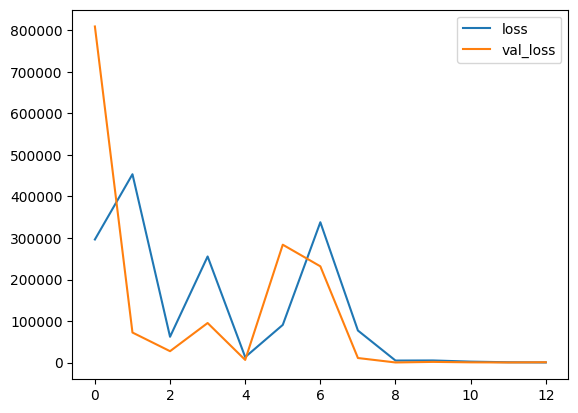

In [81]:
metrics_df[["loss","val_loss"]].plot();

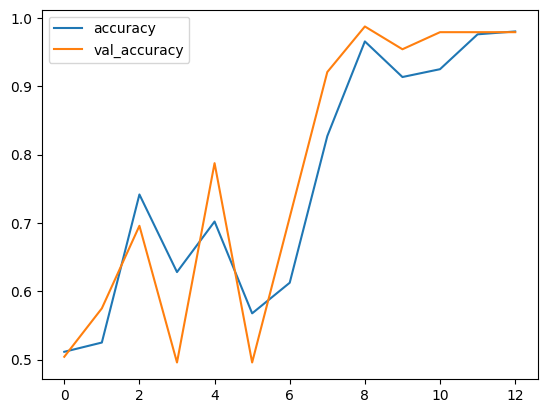

In [82]:
metrics_df[["accuracy","val_accuracy"]].plot();

In [83]:
# Make predictions on the test set
y_pred = (model.predict(X_test) > 0.5).astype("int32") 

# Calculate precision and recall
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1-score: {f1}")

print("Classification Report:")
print(classification_report(y_test, y_pred))

13/13 ━━━━━━━━━━━━━━━━━━━━ 7s 508ms/step
Precision: 1.0
Recall: 0.9656862745098039
F1-score: 0.9825436408977556
Classification Report:
              precision    recall  f1-score   support

           0       0.97      1.00      0.98       196
           1       1.00      0.97      0.98       204

    accuracy                           0.98       400
   macro avg       0.98      0.98      0.98       400
weighted avg       0.98      0.98      0.98       400



In [89]:
model.save("blood_cell_classification_custom.h5") 

Our model performs very well. Nearly perfect precision and recall for both classes and f-1 score. The main thing we can see here is that the model had a high training accuracy at about 8 epochs,which indicates quick and effective learning, and high validation accuracy at about epoch 8 as well and then continues to improve. The final training loss approaches zero, suggesting the model is fitting the training data extremely well.  Now let's compare our model to a pre-trained model. 

### Pretrained Model with VGG16

In [92]:
# Load pre-trained VGG16 without the top classification layer
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the convolutional layers
base_model.trainable = False

In [93]:
model = Sequential([
    base_model,
    Flatten(),
    Dense(128, activation='relu'),
    Dense(1, activation='sigmoid')  # Binary classification
])

In [94]:
early_stopping = EarlyStopping(monitor='val_accuracy', patience=4, restore_best_weights=True)

In [95]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [96]:
history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.2, callbacks=[early_stopping])

Epoch 1/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 174s 6s/step - accuracy: 0.5456 - loss: 1.2361 - val_accuracy: 0.6417 - val_loss: 0.4981
Epoch 2/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 152s 5s/step - accuracy: 0.8282 - loss: 0.4282 - val_accuracy: 0.9167 - val_loss: 0.3229
Epoch 3/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 152s 5s/step - accuracy: 0.9059 - loss: 0.2973 - val_accuracy: 0.9167 - val_loss: 0.2403
Epoch 4/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 150s 5s/step - accuracy: 0.9353 - loss: 0.2288 - val_accuracy: 0.9750 - val_loss: 0.2000
Epoch 5/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 380s 13s/step - accuracy: 0.9597 - loss: 0.1716 - val_accuracy: 0.9833 - val_loss: 0.1423
Epoch 6/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 155s 5s/step - accuracy: 0.9945 - loss: 0.1174 - val_accuracy: 0.9833 - val_loss: 0.1064
Epoch 7/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 161s 5s/step - accuracy: 0.9920 - loss: 0.0972 - val_accuracy: 0.9833 - val_loss: 0.0828
Epoch 8/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 159s 5s/step - accuracy: 0.9997 - loss: 0.0632 - val_accuracy: 0.9833 - 

In [97]:
metrics_df = pd.DataFrame(history.history)
print(metrics_df)

   accuracy      loss  val_accuracy  val_loss
0  0.606250  0.846993      0.641667  0.498079
1  0.850000  0.400140      0.916667  0.322934
2  0.904167  0.287528      0.916667  0.240347
3  0.939583  0.218418      0.975000  0.199988
4  0.965625  0.159137      0.983333  0.142332
5  0.988542  0.113463      0.983333  0.106414
6  0.993750  0.085937      0.983333  0.082839
7  0.998958  0.059525      0.983333  0.067617
8  0.998958  0.046847      0.983333  0.066696


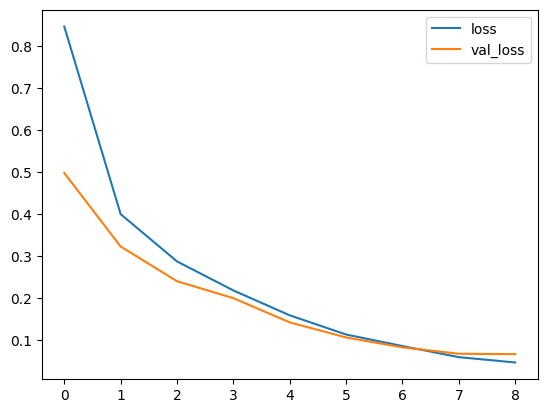

In [98]:
metrics_df[["loss","val_loss"]].plot();

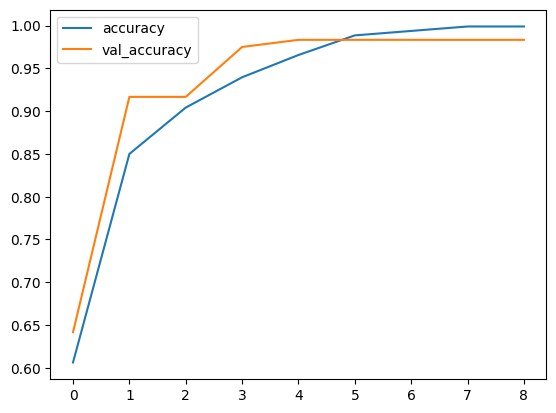

In [99]:
metrics_df[["accuracy","val_accuracy"]].plot();

In [101]:
from sklearn.metrics import classification_report
y_pred = model.predict(X_test)
y_pred = (y_pred > 0.5)  # Convert to binary predictions
print(classification_report(y_test, y_pred))

13/13 ━━━━━━━━━━━━━━━━━━━━ 51s 4s/step
              precision    recall  f1-score   support

           0       0.98      1.00      0.99       196
           1       1.00      0.98      0.99       204

    accuracy                           0.99       400
   macro avg       0.99      0.99      0.99       400
weighted avg       0.99      0.99      0.99       400



This model performed very well. Nearly perfect precision and recall for both classes and a great f-1 score. The main difference between this model and the previous is that it learns significantly faster, achieving higher accuracy within the first few epochs, as well as smoother and more consistent decrease in loss. This seems consistent with the fact that it is a pre-trained model.

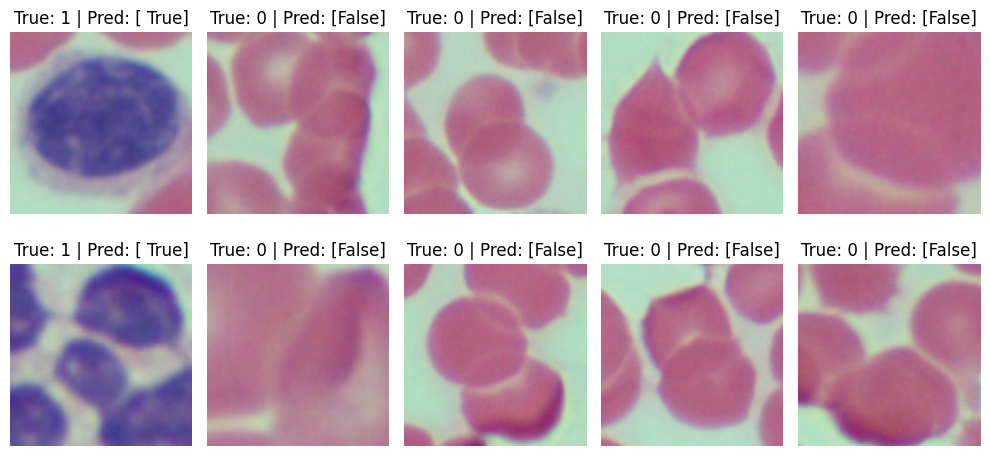

In [103]:
def plot_predictions(images, y_true, y_pred, num_samples=10):
    plt.figure(figsize=(10, 5))
    
    for i in range(num_samples):
        plt.subplot(2, 5, i+1)
        plt.imshow(images[i])  
        plt.title(f"True: {y_true[i]} | Pred: {y_pred[i]}")
        plt.axis("off")
    
    plt.tight_layout()
    plt.show()

plot_predictions(X_test[:10], y_test[:10], y_pred[:10])

## Conclusion

Overall both models are excellent and demonstrate exceptional performance. Both have strong generalization with high accuracy. Although, our model is an excellent candidate, the pre-trained model significantly accelerates learning, improves generalization, and leads to better overall performance. Based on the provided metrics, the pre-trained model appears to be the superior choice in most scenarios. Its faster training, higher accuracy, and excellent generalization make it a strong performer. However, if we have specific requirements for task specificity and control the custom model might be a viable alternative.

In [110]:
model.save("blood_cell_classification_pretrained.h5")  # Saves the model in TensorFlow's native format